In [224]:
%load_ext autoreload
%autoreload 2
import numpy as np 
import math
import os
import glob
import random
import time

from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.animation as animation
# from matplotlib import rc
from IPython.display import HTML
import pandas as pd

import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset
from torchvision.io import read_image
from torchvision.transforms.functional import crop
import torch.optim as optim

from Custom_Datasets import KineticsVideoDataset,KineticsImageDataset
from noise_transform import NoiseModel
from animate_images import animate_images

from skvideo.measure import strred
from skimage.metrics import structural_similarity as ssim


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
# run to check cuda availability
get_device = lambda : "cuda:0" if torch.cuda.is_available() else "cpu"
device = get_device()
get_device()


'cuda:0'

In [4]:
def display_image(image):
    image=image.type(torch.float32)
    image = np.transpose(image.numpy(),axes=(1,2,0))
    image = (image+1)/2
    plt.imshow(image)
    plt.show()

# Load Raw Images

Off the shelf

In [5]:
# dataset = torchvision.datasets.MovingMNIST(root="./", split = "train", download = False)#, transform=torchvision.transforms.ToTensor())
# dataloader = torch.utils.data.DataLoader(dataset,batch_size=64,shuffle=True)

# features = next(iter(dataloader))
# print(features.shape)

In [6]:
# ani=animate_images(features[1])
# HTML(ani.to_jshtml())

Custom

In [202]:
image_transforms = torchvision.transforms.Compose([
                                      #  torchvision.transforms.RandomRotation(30),
                                       torchvision.transforms.ConvertImageDtype(torch.float32),
                                       torchvision.transforms.RandomResizedCrop(size=128,scale=[0.5,1]),
                                       torchvision.transforms.RandomHorizontalFlip(),
                                       torchvision.transforms.Normalize([0.5, 0.5, 0.5],
                                                            [0.5, 0.5, 0.5])
                                    ])
video_transforms = torchvision.transforms.Compose([
                                       torchvision.transforms.ConvertImageDtype(torch.float32),
                                      #  torchvision.transforms.Resize(128),
                                      #  torchvision.transforms.CenterCrop(128),
                                      torchvision.transforms.RandomResizedCrop(size=128,scale=[0.5,1]),
                                       torchvision.transforms.Normalize([0.5, 0.5, 0.5],
                                                            [0.5, 0.5, 0.5])
                                    ])
test_transforms = torchvision.transforms.Compose([
                                      torchvision.transforms.ConvertImageDtype(torch.float32),
                                      torchvision.transforms.Resize(128),
                                      torchvision.transforms.Normalize([0.5, 0.5, 0.5],
                                                            [0.5, 0.5, 0.5])
                                      # torchvision.transforms.CenterCrop(512),
                                      # torchvision.transforms.ToTensor()
                                    ])
demo_transforms = torchvision.transforms.Compose([
                                      torchvision.transforms.ConvertImageDtype(torch.float32),
                                      torchvision.transforms.Resize(256),
                                      torchvision.transforms.Normalize([0.5, 0.5, 0.5],
                                                            [0.5, 0.5, 0.5])
                                      # torchvision.transforms.CenterCrop(512),
                                      # torchvision.transforms.ToTensor()
                                    ])

In [9]:
train_video_dataset = KineticsVideoDataset('./kinetics400_5per/train/video_annotations.csv',clip_length=10, transform=video_transforms, target_transform=None)
# train_image_dataset = KineticsImageDataset('./kinetics400_5per/train/image_annotations.csv', transform=image_transforms, target_transform=None)


train_video_dataloader = torch.utils.data.DataLoader(train_video_dataset,batch_size=16,shuffle=True)
# train_image_dataloader = torch.utils.data.DataLoader(train_image_dataset,batch_size=16,shuffle=True)

In [188]:
eval_video_dataset = KineticsVideoDataset('./kinetics400_5per/eval/video_annotations.csv',clip_length=10, transform=test_transforms, target_transform=None)
eval_video_dataloader = torch.utils.data.DataLoader(eval_video_dataset,batch_size=4,shuffle=True)


In [189]:
test_video_dataset = KineticsVideoDataset('./kinetics400_5per/test/video_annotations.csv',clip_length=10, transform=test_transforms, target_transform=None)
test_video_dataloader = torch.utils.data.DataLoader(test_video_dataset,batch_size=1,shuffle=True)

In [215]:
demo_video_dataset = KineticsVideoDataset('./kinetics400_5per/test/video_annotations.csv',clip_length=10, transform=demo_transforms, target_transform=None)
demo_video_dataloader = torch.utils.data.DataLoader(demo_video_dataset,batch_size=1,shuffle=True)

In [10]:
# features,labels = next(iter(train_image_dataloader))

# image = features[0]

# print(labels[0])
# display_image(image)

c:\Users\thomas\Documents\Atmospheric Turbulence\.venv\Lib\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


13733


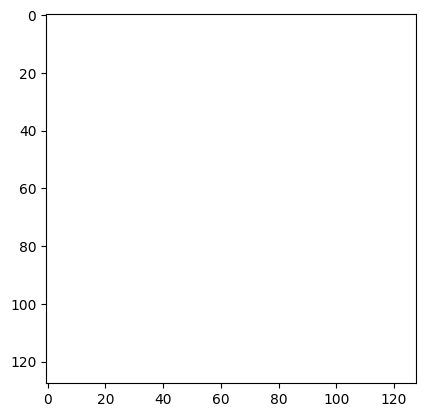

In [11]:
features = next(iter(train_video_dataloader))

features=features
print(len(train_video_dataloader))
ani=animate_images(features[0])
HTML(ani.to_jshtml())



# Model

In [97]:
class RNN(nn.Module):
	"""
	Inputs:
		input size: int. Number of input features for each element in the sequence
		hidden_size: int. Number of output features for each element in the sequence
		num_layers: int. Number of internally stacked layers (not sequence length)

	"""
	def __init__(self, input_size, hidden_size, num_layers):
		super(RNN, self).__init__()

		self.num_layers = num_layers
		self.hidden_size = hidden_size

		self.rnn = nn.GRU(input_size, hidden_size, num_layers, batch_first=True)
		# >>> rnn = nn.GRU(10, 20, 2)
		# >>> input = torch.randn(5, 3, 10) [N,sequence length,input_size]
		# >>> h0 = torch.randn(2, 3, 20)
		# >>> output, hn = rnn(input, h0)
    
    
	def forward(self, x): 
		"""
		Inputs:
			x: Tensor of shape [N,seq_len,input_size]
		Outputs:
			out: Tensor of shape [N,seq_len,hidden_size]
		"""
		batch_size = x.size(0)

		# initialize hidden state with appropriate size
		h0 = torch.zeros(self.num_layers, batch_size, self.hidden_size, device=x.device)

		#hn is the final hidden state. out 
		out, hn = self.rnn(x, h0) #[batch_size,sequence_length,hidden_size]

		# # use the last index of RNN output
		# out = out[:,-1,:] # shape: [batch_size, hidden_size]

		return out 
	

class CvBlock(nn.Module):
	'''(Conv2d => BN => ReLU) x 2'''
	def __init__(self, in_ch, out_ch):
		super(CvBlock, self).__init__()
		self.convblock = nn.Sequential(
			nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1, bias=False),
			nn.BatchNorm2d(out_ch),
			nn.ReLU(inplace=True),
			nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1, bias=False),
			nn.BatchNorm2d(out_ch),
			nn.ReLU(inplace=True)
		)

	def forward(self, x):
		return self.convblock(x)

class InputCvBlock(nn.Module):
	'''(Conv with num_in_frames groups => BN => ReLU) + (Conv => BN => ReLU)'''
	def __init__(self, num_in_frames, out_ch,noise_map=1): #set num_in_channels to 1 for single frame denoising
		super(InputCvBlock, self).__init__()
		self.interm_ch = 30
		self.convblock = nn.Sequential(
			nn.Conv2d(num_in_frames*(3+noise_map), num_in_frames*self.interm_ch, kernel_size=3, padding=1, groups=num_in_frames, bias=False), #(3+1) =rgb + theta per frame
			nn.BatchNorm2d(num_in_frames*self.interm_ch),
			nn.ReLU(inplace=True),
			nn.Conv2d(num_in_frames*self.interm_ch, out_ch, kernel_size=3, padding=1, bias=False),
			nn.BatchNorm2d(out_ch),
			nn.ReLU(inplace=True)
		)

	def forward(self, x):
		return self.convblock(x)

class DownBlock(nn.Module):
	'''Downscale + (Conv2d => BN => ReLU)*2'''
	def __init__(self, in_ch, out_ch):
		super(DownBlock, self).__init__()
		self.convblock = nn.Sequential(
			nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1, stride=2, bias=False),
			nn.BatchNorm2d(out_ch),
			nn.ReLU(inplace=True),
			CvBlock(out_ch, out_ch)
		)

	def forward(self, x):
		return self.convblock(x)

class UpBlock(nn.Module):
	'''(Conv2d => BN => ReLU)*2 + Upscale'''
	def __init__(self, in_ch, out_ch):
		super(UpBlock, self).__init__()
		self.convblock = nn.Sequential(
			CvBlock(in_ch, in_ch),
			nn.Conv2d(in_ch, out_ch*4, kernel_size=3, padding=1, bias=False),
			nn.PixelShuffle(2)
		)

	def forward(self, x):
		return self.convblock(x)

class OutputCvBlock(nn.Module):
	'''Conv2d => BN => ReLU => Conv2d'''
	def __init__(self, in_ch, out_ch):
		super(OutputCvBlock, self).__init__()
		self.convblock = nn.Sequential(
			nn.Conv2d(in_ch, in_ch, kernel_size=3, padding=1, bias=False),
			nn.BatchNorm2d(in_ch),
			nn.ReLU(inplace=True),
			nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1, bias=False)
		)

	def forward(self, x):
		return self.convblock(x)

class DenBlock(nn.Module):
	""" Definition of the denosing block of FastDVDnet.
	Inputs of constructor:
		num_input_frames: int. number of input frames
	Inputs of forward():
		xn: input frames of dim [N, C, H, W], (C=3 RGB)
		noise_map: array with noise map of dim [N, 1, H, W]
	"""

	def __init__(self, num_input_frames=3,residual=True):
		super(DenBlock, self).__init__()
		self.chs_lyr0 = 32
		self.chs_lyr1 = 64
		self.chs_lyr2 = 128

		self.residual = residual

		self.inc = InputCvBlock(num_in_frames=num_input_frames, out_ch=self.chs_lyr0)
		self.downc0 = DownBlock(in_ch=self.chs_lyr0, out_ch=self.chs_lyr1)
		self.downc1 = DownBlock(in_ch=self.chs_lyr1, out_ch=self.chs_lyr2)
		self.upc2 = UpBlock(in_ch=self.chs_lyr2, out_ch=self.chs_lyr1)
		self.upc1 = UpBlock(in_ch=self.chs_lyr1, out_ch=self.chs_lyr0)
		self.outc = OutputCvBlock(in_ch=self.chs_lyr0, out_ch=3)

		self.reset_params()

	@staticmethod
	def weight_init(m):
		if isinstance(m, nn.Conv2d):
			nn.init.kaiming_normal_(m.weight, nonlinearity='relu')

	def reset_params(self):
		for _, m in enumerate(self.modules()):
			self.weight_init(m)

	# def forward(self, in0, noise_map):
	def forward(self, in0, in1, in2,theta):#, noise_map): #in2 is the current frame
		'''Args:
			inX: Tensor, [N, C, H, W] in the [0., 1.] range
			noise_map: Tensor [N, 1, H, W] in the [0., 1.] range
		'''
		# Input convolution block
		x0 = self.inc(torch.cat((in0, theta, in1, theta, in2, theta), dim=1))
		# x0 = self.inc(torch.cat((in0, noise_map, in1, noise_map, in2, noise_map,theta), dim=1))
		# x0 = self.inc(torch.cat((in0, noise_map), dim=1))
		# Downsampling
		x1 = self.downc0(x0)
		x2 = self.downc1(x1)
		# Upsampling
		x2 = self.upc2(x2)
		x1 = self.upc1(x1+x2)
		# Estimation
		x = self.outc(x0+x1)

		# Residual Modified to learn only the relation between the current frame and the output frame
		if(self.residual):
			x = in2 - x

		return x
class NoiselessDenBlock(nn.Module):
	""" Definition of the denosing block of FastDVDnet.
	Inputs of constructor:
		num_input_frames: int. number of input frames
	Inputs of forward():
		xn: input frames of dim [N, C, H, W], (C=3 RGB)
		noise_map: array with noise map of dim [N, 1, H, W]
	"""

	def __init__(self, num_input_frames=3):
		super(NoiselessDenBlock, self).__init__()
		self.chs_lyr0 = 32
		self.chs_lyr1 = 64
		self.chs_lyr2 = 128

		self.inc = InputCvBlock(num_in_frames=num_input_frames, out_ch=self.chs_lyr0,noise_map=0)
		self.downc0 = DownBlock(in_ch=self.chs_lyr0, out_ch=self.chs_lyr1)
		self.downc1 = DownBlock(in_ch=self.chs_lyr1, out_ch=self.chs_lyr2)
		self.upc2 = UpBlock(in_ch=self.chs_lyr2, out_ch=self.chs_lyr1)
		self.upc1 = UpBlock(in_ch=self.chs_lyr1, out_ch=self.chs_lyr0)
		self.outc = OutputCvBlock(in_ch=self.chs_lyr0, out_ch=3)

		self.reset_params()

	@staticmethod
	def weight_init(m):
		if isinstance(m, nn.Conv2d):
			nn.init.kaiming_normal_(m.weight, nonlinearity='relu')

	def reset_params(self):
		for _, m in enumerate(self.modules()):
			self.weight_init(m)

	# def forward(self, in0, noise_map):
	def forward(self, in0, in1, in2):#, noise_map): #in2 is the current frame
		'''Args:
			inX: Tensor, [N, C, H, W] in the [0., 1.] range
			noise_map: Tensor [N, 1, H, W] in the [0., 1.] range
		'''
		# Input convolution block
		x0 = self.inc(torch.cat((in0, in1, in2, ), dim=1))
		# x0 = self.inc(torch.cat((in0, noise_map, in1, noise_map, in2, noise_map,theta), dim=1))
		# x0 = self.inc(torch.cat((in0, noise_map), dim=1))
		# Downsampling
		x1 = self.downc0(x0)
		x2 = self.downc1(x1)
		# Upsampling
		x2 = self.upc2(x2)
		x1 = self.upc1(x1+x2)
		# Estimation
		x = self.outc(x0+x1)

		# Residual Modified to learn only the relation between the current frame and the output frame
		x = in2 - x

		return x
class PrelimEncoder(nn.Module):
	""" Definition of the PrelimEncoder.
	Inputs of constructor:
		out_features: int. number of features for RNN
	Inputs of forward():
		in0: input frame of dim [N, C, H, W], (C=3 RGB)
	"""

	def __init__(self,out_features=32*32,im_size=256):
		super(PrelimEncoder, self).__init__()
		self.chs_lyr0 = 16
		self.chs_lyr1 = 32
		self.chs_lyr2 = 32
		self.out_features=out_features
		self.img_size=im_size

		self.inc = InputCvBlock(num_in_frames=1, out_ch=self.chs_lyr0,noise_map=0)
		self.downc0 = DownBlock(in_ch=self.chs_lyr0, out_ch=self.chs_lyr1)
		self.downc1 = DownBlock(in_ch=self.chs_lyr1, out_ch=self.chs_lyr2)

		# self.lin = nn.Linear(2007040,self.out_features)
		self.reduction = nn.Conv2d(32, 1, kernel_size=3, padding=1, bias=False)

		self.reset_params()

	@staticmethod
	def weight_init(m):
		if isinstance(m, nn.Conv2d):
			nn.init.kaiming_normal_(m.weight, nonlinearity='relu')

	def reset_params(self):
		for _, m in enumerate(self.modules()):
			self.weight_init(m)

	def forward(self, x):
		'''Args:
			x: Tensor, [N, S, C, H, W] in the [0., 1.] range
		'''
		N,S,C,H,W = x.size()
		# convert from [N, num_frames, C. H, W] to [N*num_frames, C. H, W] 
		x = x.view(N*S, C, H, W)
		
		# Input convolution block
		x0 = self.inc(x)

		# Downsampling
		x1 = self.downc0(x0)
		
		x2 = self.downc1(x1)

		# Estimation
		x3 = self.reduction(x2)
		# x=x.flatten()
		# x = self.lin(x)
		# print(x.size())
		# print(x0.size())
		# print(x1.size())
		# print(x2.size())
		# print(x3.size())
		# convert from [N*num_frames, out_features] to [N, num_frames, out_features] 
		out = x3.view(N,S, self.out_features)

		return out
class AVDnet_128(nn.Module):
	""" Definition of the Modified AVDnet model: kernelized video denoiser (title needs some work)
	Inputs of forward():
		xn: input frames of dim [N, C, H, W], (C=3 RGB)
		noise_map: array with noise map of dim [N, 1, H, W]
	"""

	def __init__(self, num_input_frames=10):
		super(AVDnet_128, self).__init__()
		self.num_input_frames = num_input_frames
		self.theta_size=32
		# Define models of each denoising stage
		self.encoder=PrelimEncoder(self.theta_size**2)
		self.rnn = RNN(self.theta_size**2,self.theta_size**2,2) # [number of features from input conv,hidden size,number layers]
		self.den = DenBlock(num_input_frames=3)
		self.upscale = nn.Upsample(scale_factor=4, mode='bilinear')
        # Init weights
		self.reset_params()

	@staticmethod
	def weight_init(m):
		if isinstance(m, nn.Conv2d):
			nn.init.kaiming_normal_(m.weight, nonlinearity='relu')

	def reset_params(self):
		for _, m in enumerate(self.modules()):
			self.weight_init(m)

	def forward(self, x):#, noise_map):
		'''Args:
			x: Tensor, [N, S, C, H, W] in the [0., 1.] range
			noise_map: Tensor [N, 1, H, W] in the [0., 1.] range
		'''
		N,S,C,H,W = x.size()

		theta = self.encoder(x) 
		#output shape: [N,num_frames,features] features =256

		theta = self.rnn(theta) 
		#output shape: [batch,sequence,hiddensize ]

		# print(x0.shape)
		frames = torch.permute(x,(1,0,2,3,4)) #converts to shape [num_frames,N, C, H, W]
		out=[]
		for frame_id in range(self.num_input_frames-2):
			frame_theta = theta[:,frame_id+2,:]
			# frame_theta=theta
			frame_theta = frame_theta.view(N,1,self.theta_size,self.theta_size)
			frame_theta = self.upscale(frame_theta)

			x0 = frames[frame_id+0]
			x1 = frames[frame_id+1]
			x2 = frames[frame_id+2]
			out.append(self.den(x0, x1, x2, frame_theta))
		out=torch.stack(out,dim=1) 
		return out

class Unet_128(nn.Module):
	""" Definition of the Modified AVDnet model: kernelized video denoiser (title needs some work)
	Inputs of forward():
		xn: input frames of dim [N, C, H, W], (C=3 RGB)
		noise_map: array with noise map of dim [N, 1, H, W]
	"""

	def __init__(self, num_input_frames=10):
		super(Unet_128, self).__init__()
		self.num_input_frames = num_input_frames
		self.theta_size=32
		# Define models of each denoising stage
		# self.encoder=PrelimEncoder(self.theta_size**2)
		# self.rnn = RNN(self.theta_size**2,self.theta_size**2,2) # [number of features from input conv,hidden size,number layers]
		self.den = NoiselessDenBlock(num_input_frames=3)
		self.upscale = nn.Upsample(scale_factor=4, mode='bilinear')
        # Init weights
		self.reset_params()

	@staticmethod
	def weight_init(m):
		if isinstance(m, nn.Conv2d):
			nn.init.kaiming_normal_(m.weight, nonlinearity='relu')

	def reset_params(self):
		for _, m in enumerate(self.modules()):
			self.weight_init(m)

	def forward(self, x):#, noise_map):
		'''Args:
			x: Tensor, [N, S, C, H, W] in the [0., 1.] range
			noise_map: Tensor [N, 1, H, W] in the [0., 1.] range
		'''
		N,S,C,H,W = x.size()

		# theta = self.encoder(x) 
		#output shape: [N,num_frames,features] features =256

		# theta = self.rnn(theta) 
		#output shape: [batch,sequence,hiddensize ]

		# print(x0.shape)
		frames = torch.permute(x,(1,0,2,3,4)) #converts to shape [num_frames,N, C, H, W]
		out=[]
		for frame_id in range(self.num_input_frames-2):
			# frame_theta = theta[:,frame_id+2,:]
			# frame_theta=theta
			# frame_theta = frame_theta.view(N,1,self.theta_size,self.theta_size)
			# frame_theta = self.upscale(frame_theta)

			x0 = frames[frame_id+0]
			x1 = frames[frame_id+1]
			x2 = frames[frame_id+2]
			out.append(self.den(x0, x1, x2))
		out=torch.stack(out,dim=1) #[N,2:sequence, C, H, W]
		# out = self.den(x0, x1, x2, theta)#,noise_map)
		

        
		# x20 = self.temp1(x0, x1, x2, noise_map)
		# x21 = self.temp1(x1, x2, x3, noise_map)
		# x22 = self.temp1(x2, x3, x4, noise_map)

		# #Second stage
		# x = self.temp2(x20, x21, x22, noise_map)

		return out
class AVDnet_NoResidual_128(nn.Module):
	""" Definition of the Modified AVDnet model: kernelized video denoiser (title needs some work)
	Inputs of forward():
		xn: input frames of dim [N, C, H, W], (C=3 RGB)
		noise_map: array with noise map of dim [N, 1, H, W]
	"""

	def __init__(self, num_input_frames=10):
		super(AVDnet_NoResidual_128, self).__init__()
		self.num_input_frames = num_input_frames
		self.theta_size=32
		# Define models of each denoising stage
		self.encoder=PrelimEncoder(self.theta_size**2)
		self.rnn = RNN(self.theta_size**2,self.theta_size**2,2) # [number of features from input conv,hidden size,number layers]
		self.den = DenBlock(num_input_frames=3,residual=False)
		self.upscale = nn.Upsample(scale_factor=4, mode='bilinear')
        # Init weights
		self.reset_params()

	@staticmethod
	def weight_init(m):
		if isinstance(m, nn.Conv2d):
			nn.init.kaiming_normal_(m.weight, nonlinearity='relu')

	def reset_params(self):
		for _, m in enumerate(self.modules()):
			self.weight_init(m)

	def forward(self, x):#, noise_map):
		'''Args:
			x: Tensor, [N, S, C, H, W] in the [0., 1.] range
			noise_map: Tensor [N, 1, H, W] in the [0., 1.] range
		'''
		N,S,C,H,W = x.size()

		theta = self.encoder(x) 
		#output shape: [N,num_frames,features] features =256

		theta = self.rnn(theta) 
		#output shape: [batch,sequence,hiddensize ]

		# print(x0.shape)
		frames = torch.permute(x,(1,0,2,3,4)) #converts to shape [num_frames,N, C, H, W]
		out=[]
		for frame_id in range(self.num_input_frames-2):
			frame_theta = theta[:,frame_id+2,:]
			# frame_theta=theta
			frame_theta = frame_theta.view(N,1,self.theta_size,self.theta_size)
			frame_theta = self.upscale(frame_theta)

			x0 = frames[frame_id+0]
			x1 = frames[frame_id+1]
			x2 = frames[frame_id+2]
			out.append(self.den(x0, x1, x2, frame_theta))
		out=torch.stack(out,dim=1) 
		return out
	


In [13]:
def load_model(model,optimizer,dir,model_name):
    if not os.path.exists(dir):
        os.makedirs(dir)
    state_path = os.path.join(dir, f"{model_name}.pt")
    if os.path.exists(state_path):
        state = torch.load(state_path)
        model.load_state_dict(state["model_state_dict"])
        optimizer.load_state_dict(state["optimizer_state_dict"])
        starting_epoch = state["train_epoch"]
        test_loss = state["test_loss"]
    else:
        starting_epoch = 0
        test_loss=[]
    return starting_epoch,test_loss
def save_model(out_path,model,optimizer,train_epoch,test_loss ):
    # test_loss.append(eval(model, task_name, input_cov, task_cov)[0])
    training_state = {
        "model_state_dict": model.state_dict(),
        "optimizer_state_dict": optimizer.state_dict(),
        "train_epoch": train_epoch,
        "test_loss": test_loss
    }
    torch.save(training_state, out_path)
            


In [114]:
def PSNR(original, compressed): 
    mse = torch.mean((original - compressed) ** 2) 
    if(mse == 0):  # MSE is zero means no noise is present in the signal . 
                  # Therefore PSNR have no importance. 
        return 100
    max_pixel = 1.0
    psnr = 20 * math.log10(max_pixel / math.sqrt(mse)) 
    return psnr
def mean_strred(original,compressed):
    b=original.size()[0]
    # print(original.permute(0,1,3,4,2).mean(dim=-1).unsqueeze(dim=-1).size())
    o = original.permute(0,1,3,4,2).mean(dim=-1).unsqueeze(dim=-1)
    c = compressed.permute(0,1,3,4,2).mean(dim=-1).unsqueeze(dim=-1)

    total = 0
    for batch in range(b):
        # print(strred(o[batch],c[batch]))
        total += strred(o[batch],c[batch])[1]
    return total/b
def mean_ssim(original,compressed):
    b=original.size()[0]
    f=original.size()[1]
    # print(original.permute(0,1,3,4,2).mean(dim=-1).unsqueeze(dim=-1).size())
    o = original.mean(dim=2)
    c = compressed.mean(dim=2)

    total = 0
    for batch in range(b):
        for frame in range(f):
        # print(strred(o[batch],c[batch]))
            total += ssim(o[batch,frame].numpy(),c[batch,frame].numpy(),data_range=2)
    return total/(f*b)

In [178]:
def model_eval(model,noise_generator,criterion,dataloader,max=100,verbose=False):
    model.eval()
    # print(len(dataloader))
    with torch.no_grad():
        # losses = torch.zeros((len(dataloader)))
        # psnr = torch.zeros((len(dataloader)))
        losses = []
        psnr = []
        strred_score = []
        ssim = []
        times=[]
        for i, y in tqdm(enumerate(dataloader)):
            if i>=max:
                break
            y=y.cuda()
            x = noise_generator(y)
            start = time.time()
            output=model(x)
            times.append(time.time()-start)
            losses.append(criterion(output, y[:,2:,:,:,:])/y.size()[0]) #frames depend on prior frames, so first two are lost
            if verbose:
                psnr.append(PSNR(y[:,2:,:,:,:],output))
                strred_score.append(mean_strred(y[:,2:,:,:,:].cpu(),output.detach().cpu()))
                ssim.append(mean_ssim(y[:,2:,:,:,:].cpu(),output.detach().cpu()))
            # losses[i] = criterion(output, y[:,2:,:,:,:])/y.size()[0] #frames depend on prior frames, so first two are lost
            # psnr[i]= PSNR(y[:,2:,:,:,:],output)
            # print(losses[i],psnr[i])
            
    losses = torch.stack(losses,0)
    # psnr = torch.stack(psnr,0)         
    mean_loss = losses.mean().item()
    
    if verbose:
        mean_time = np.mean(times)
        mean_psnr = np.mean(psnr)
        mean_strred_score = np.mean(strred_score)
        mean_ssim_score=np.mean(ssim)
        return mean_loss,mean_psnr,mean_strred_score,mean_ssim_score,mean_time
    else:
        return mean_loss
    
def baseline(noise_generator,criterion,dataloader,max=100):

    losses = []
    psnr = []
    strred_score = []
    ssim = []
    times=[]
    for i, y in tqdm(enumerate(dataloader)):
        if i>=max:
            break
        x = noise_generator(y).cpu()
        start = time.time()
        times.append(time.time()-start)
        losses.append(criterion(x, y)/y.size()[0]) #frames depend on prior frames, so first two are lost

        psnr.append(PSNR(y,x))
        strred_score.append(mean_strred(y,x))
        ssim.append(mean_ssim(y,x))

            
    losses = torch.stack(losses,0)
       
    mean_loss = losses.mean().item()
    mean_time = np.mean(times)
    mean_psnr = np.mean(psnr)
    mean_strred_score = np.mean(strred_score)
    mean_ssim_score=np.mean(ssim)
    return mean_loss,mean_psnr,mean_strred_score,mean_ssim_score,mean_time


In [17]:
def train(model,out_dir,model_name,noise_generator,num_epochs=5,print_interval=200,save_interval=1000,criterion=nn.MSELoss(reduction='sum').to(device),lr=0.001,):
    optimizer=optim.Adam(model.parameters(), lr=lr)
    start_epoch,test_loss = load_model(model,optimizer,out_dir,model_name)
    model.train()
    print("starting ...")
    for epoch in range(start_epoch,num_epochs):
        # random.shuffle(train_dataset)
        
        for i, y in enumerate(train_video_dataloader):
            
            optimizer.zero_grad()
            y=y.cuda()
            # x = noise_generator.discrete_variance_noise_convolution(y,device,k_size=5,max_sigma=8).to(device)
            x = noise_generator(y)
            output=model(x)
            loss = criterion(output, y[:,2:,:,:,:])/y.size()[0]  #frames depend on prior frames, so first two are lost. Divide by batch size

            loss.backward()
            optimizer.step()
            
            if (i) % print_interval == 0:
                print(
                    f"Epoch [{epoch + 1}/{num_epochs}], "
                    f"Step [{i + 1}/{len(train_video_dataloader)}], "
                    f"Loss: {loss.item():.4f}"
                    )
            if (i + 1) % save_interval == 0:
                eval_loss=model_eval(model,noise_generator,criterion,eval_video_dataloader)
                model.train()
                test_loss.append(eval_loss)
                print(
                    f"Epoch [{epoch + 1}/{num_epochs}], "
                    f"Step [{i + 1}/{len(train_video_dataloader)}], "
                    f"Eval Loss: {eval_loss:.4f} "
                    )
                save_model(os.path.join(out_dir, f"{model_name}.pt"),model,optimizer,epoch,test_loss )
        
        # test_loss.append(model_eval(model))
        eval_loss=model_eval(model,noise_generator,criterion,eval_video_dataloader)
        model.train()
        test_loss.append(eval_loss)
        save_model(os.path.join(out_dir, f"{model_name}.pt"),model,optimizer,epoch+1,test_loss )
    print("Done")
    return model,test_loss




In [20]:
from torchsummary import summary
model = AVDnet_128().to(device)
summary(model, (10, 3, 128, 128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 30, 128, 128]             810
       BatchNorm2d-2         [-1, 30, 128, 128]              60
              ReLU-3         [-1, 30, 128, 128]               0
            Conv2d-4         [-1, 16, 128, 128]           4,320
       BatchNorm2d-5         [-1, 16, 128, 128]              32
              ReLU-6         [-1, 16, 128, 128]               0
      InputCvBlock-7         [-1, 16, 128, 128]               0
            Conv2d-8           [-1, 32, 64, 64]           4,608
       BatchNorm2d-9           [-1, 32, 64, 64]              64
             ReLU-10           [-1, 32, 64, 64]               0
           Conv2d-11           [-1, 32, 64, 64]           9,216
      BatchNorm2d-12           [-1, 32, 64, 64]              64
             ReLU-13           [-1, 32, 64, 64]               0
           Conv2d-14           [-1, 32,

In [151]:
model_name = "constant_noise"
model = AVDnet_128().to(device)
criterion = nn.MSELoss(reduction='sum').to(device)
noise_generator = lambda y: NoiseModel().discrete_variance_noise_convolution(y,device,k_size=5,noise_steps=4,max_sigma=8).to(device) 
model,test_loss=train(model,out_dir = './Models/AVDnet_128/',model_name=model_name, noise_generator=noise_generator,criterion=criterion)

starting ...
Done


In [245]:
model_name = "random_noise"
model = AVDnet_128().to(device)
criterion = nn.MSELoss(reduction='sum').to(device)
noise_generator = lambda y: NoiseModel().discrete_variance_noise_convolution(y,device,k_size=random.choice([3,5,7]),noise_steps=4,max_sigma=random.choice([1,2,3,4,5,6,7,8,9,10])).to(device) 
model,test_loss=train(model,out_dir = './Models/AVDnet_128/',model_name=model_name, noise_generator=noise_generator,criterion=criterion)

starting ...
Done


In [240]:
model_name = "no_rnn"
model = Unet_128().to(device)
criterion = nn.MSELoss(reduction='sum').to(device)
noise_generator = lambda y: NoiseModel().discrete_variance_noise_convolution(y,device,k_size=random.choice([3,5,7]),noise_steps=4,max_sigma=random.choice([1,2,3,4,5,6,7,8,9,10])).to(device) 
model,test_loss=train(model,out_dir = './Models/AVDnet_128/',model_name=model_name, noise_generator=noise_generator,criterion=criterion)

starting ...
Done


In [98]:
model_name = "no_residual"
model = AVDnet_NoResidual_128().to(device)
criterion = nn.MSELoss(reduction='sum').to(device)
noise_generator = lambda y: NoiseModel().discrete_variance_noise_convolution(y,device,k_size=random.choice([3,5,7]),noise_steps=4,max_sigma=random.choice([1,2,3,4,5,6,7,8,9,10])).to(device) 
model,test_loss=train(model,out_dir = './Models/AVDnet_128/',model_name=model_name, noise_generator=noise_generator,criterion=criterion)

starting ...
Done


MovieWriter ffmpeg unavailable; using Pillow instead.


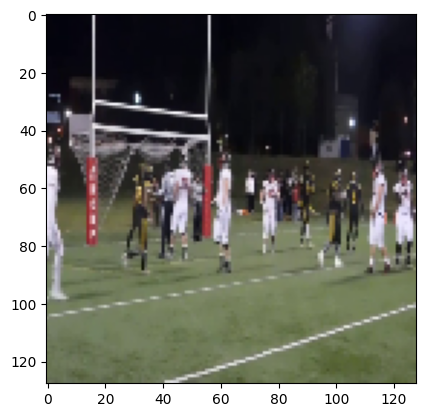

In [199]:
features = next(iter(eval_video_dataloader))
ani=animate_images(features[0][2:,:,:,:].detach().cpu(),save=False)
HTML(ani.to_jshtml()) 

PSNR 20.061373354000022
st-rred 0.5842336043715477
ssim 0.8920528161796945


MovieWriter ffmpeg unavailable; using Pillow instead.


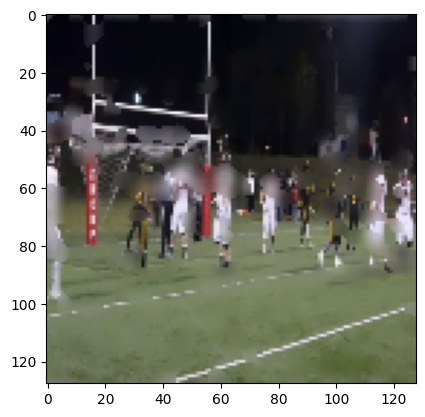

In [201]:
noise_generator = lambda y: NoiseModel().discrete_variance_noise_convolution(y,device,k_size=7,noise_steps=4,max_sigma=8).to(device) 
noisy_features=noise_generator(features)
print('PSNR',PSNR(features[:,2:,:,:,:],noisy_features[:,2:,:,:,:].detach().cpu()))

print('st-rred',mean_strred(features[:,2:,:,:,:],noisy_features[:,2:,:,:,:].detach().cpu()))
print('ssim', mean_ssim(features[:,2:,:,:,:],noisy_features[:,2:,:,:,:].detach().cpu()))
ani=animate_images(noisy_features[0][2:,:,:,:].detach().cpu())
HTML(ani.to_jshtml())

psnr 29.108238531254074
st-rred 0.03721881564706564
ssim 0.9826847918548318


MovieWriter ffmpeg unavailable; using Pillow instead.


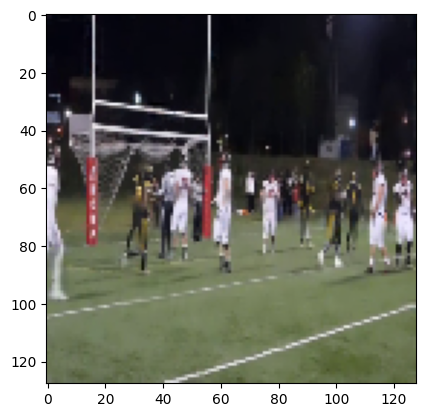

In [200]:
model_output = model(noisy_features.cuda()).detach().cpu()
print('psnr', PSNR(features[:,2:,:,:,:],model_output))
# print(features[:,2:,:,:,:])
print('st-rred',mean_strred(features[:,2:,:,:,:],model_output))
print('ssim', mean_ssim(features[:,2:,:,:,:],model_output))
# print(model_output[0])
ani=animate_images(model_output[0].clip(-1,1))
HTML(ani.to_jshtml())

In [145]:
print(model_eval(model,noise_generator,criterion,eval_video_dataloader,verbose=False))

100it [00:22,  4.44it/s]

1361.069091796875


starting ...
Done


0it [00:00, ?it/s]c:\Users\thomas\Documents\Atmospheric Turbulence\.venv\Lib\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
1000it [03:06,  5.37it/s]


random_noise 727.377197265625 29.44652940518555 0.0868211782790604 0.9737537152491027 0.0017975841999053953
starting ...
Done


1000it [03:02,  5.48it/s]


constant_noise 1351.822021484375 27.437982299663254 0.11801585814412101 0.9572749094843781 0.0018106760263442994
starting ...
Done


1000it [03:01,  5.50it/s]


no_rnn 1204.8902587890625 27.007225450067423 0.1957614199804957 0.9551644299194976 0.0015965293884277344


1000it [02:42,  6.16it/s]

baseline 2511.759033203125 24.12644089780803 0.29118400044855663 0.9387718158070506 0.0
       Model Name    Test Loss       PSNR      SSIM    STRRED  \
0    random_noise   727.377197  29.446529  0.973754  0.086821   
1  constant_noise  1351.822021  27.437982  0.957275  0.118016   
2          no_rnn  1204.890259  27.007225  0.955164  0.195761   
3        baseline  2511.759033  24.126441  0.938772  0.291184   

   Frame Inference Time  
0              0.001798  
1              0.001811  
2              0.001597  
3              0.000000  


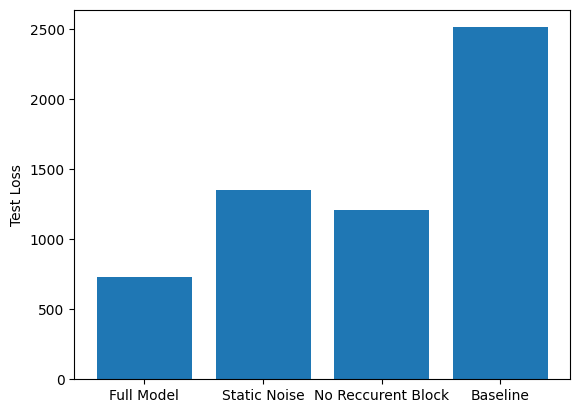

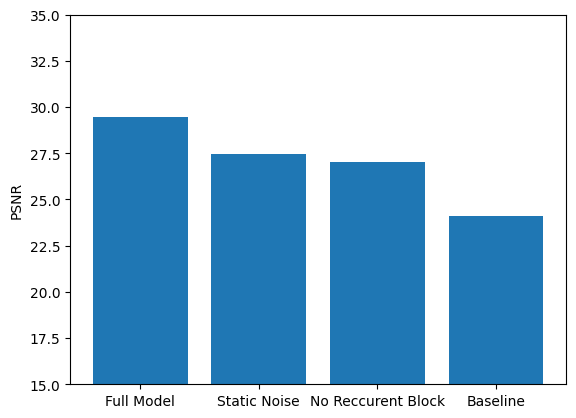

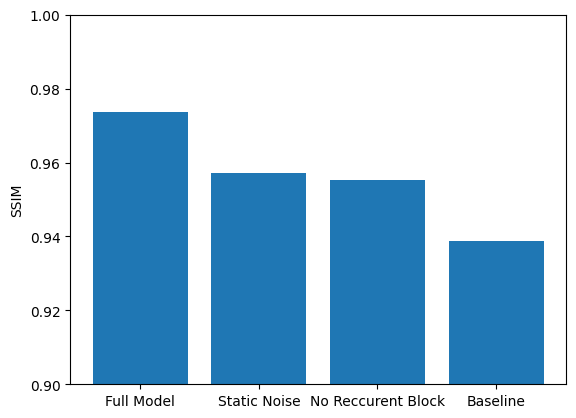

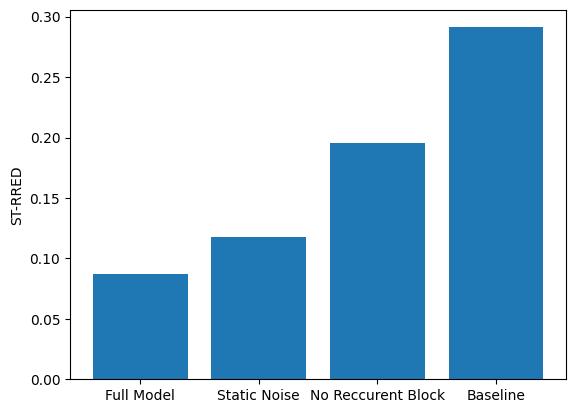

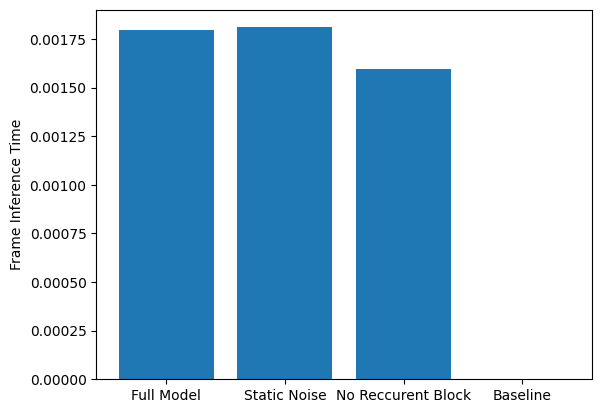

In [195]:
model_types = [AVDnet_128().to(device),AVDnet_128().to(device),Unet_128().to(device)]
model_names = ["random_noise","constant_noise","no_rnn"]
criterion = nn.MSELoss(reduction='sum').to(device)
noise_generator = lambda y: NoiseModel().discrete_variance_noise_convolution(y,device,k_size=random.choice([3,5,7]),noise_steps=4,max_sigma=random.choice([4,5,6,7,8,9,10])).to(device) 

m=1000

data = []
for model_name,model in zip(model_names,model_types):
    criterion = nn.MSELoss(reduction='sum').to(device)
    model,test_loss=train(model,out_dir = './Models/AVDnet_128/',model_name=model_name, noise_generator=noise_generator,criterion=criterion)
    loss,psnr,strred_score,ssim_score,times = model_eval(model,noise_generator,criterion,test_video_dataloader,max=m,verbose=True)
    times=times/10 #divide by number of frames per sample
    print(model_name,loss,psnr,strred_score,ssim_score,times)
    data.append([model_name,loss,psnr,ssim_score ,strred_score,times]) #{

loss,psnr,strred_score,ssim_score,times = baseline(noise_generator,criterion,test_video_dataloader,max=m)
    
data.append(['baseline',loss,psnr,ssim_score ,strred_score,times/10])
print('baseline',loss,psnr,strred_score,ssim_score,times)

model_names=["Full Model","Static Noise","No Reccurent Block","Baseline"]

df = pd.DataFrame(data,columns=['Model Name','Test Loss','PSNR','SSIM','STRRED','Frame Inference Time'])
print(df)
# df['Eval Loss'].plot(x=model_names,kind='bar')
plt.bar(model_names,df['Test Loss'])
plt.ylabel("Test Loss")
plt.show()

plt.bar(model_names,df['PSNR'])
plt.ylabel("PSNR")
plt.ylim([15,35])
plt.show()

plt.bar(model_names,df['SSIM'])
plt.ylabel("SSIM")
plt.ylim([0.9,1])
plt.show()

plt.bar(model_names,df['STRRED'])
plt.ylabel("ST-RRED")
plt.show()

plt.bar(model_names,df['Frame Inference Time'])
plt.ylabel("Frame Inference Time")
plt.show()


starting ...
Done
starting ...
Done
starting ...
Done


<function matplotlib.pyplot.show(close=None, block=None)>

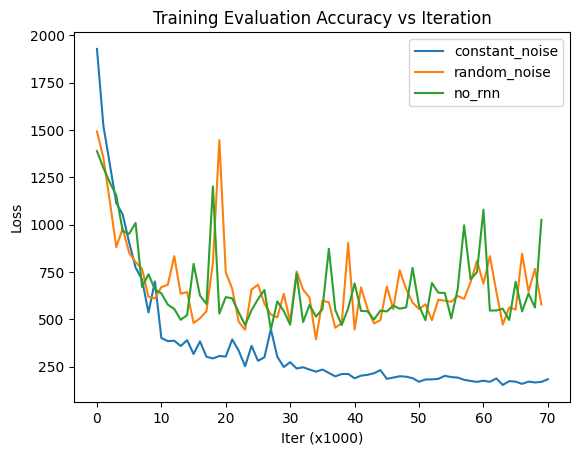

In [156]:
model_types = [AVDnet_128().to(device),AVDnet_128().to(device),Unet_128().to(device)]
model_names = ["constant_noise","random_noise","no_rnn"]

for model_name,model in zip(model_names,model_types):
    criterion = nn.MSELoss(reduction='sum').to(device)
    model,test_loss=train(model,out_dir = './Models/AVDnet_128/',model_name=model_name, noise_generator=None,criterion=None)

    plt.plot(np.arange(len(test_loss)),test_loss,label = model_name)
plt.legend()
plt.title("Training Evaluation Accuracy vs Iteration")
plt.xlabel("Iter (x1000)")
plt.ylabel("Loss")
plt.show




In [228]:
def split_frames(clip,ratio=2):
    output=[]
    _,_,_,H,W=clip.size()
    new_H=H//ratio
    new_W=W//ratio
    for i in range(ratio):
        for j in range(ratio):
            output.append(crop(clip,i*new_H,j*new_W,new_H,new_W))
    return output
def join_frames(clip_list):
    B,F,C,H,W=clip_list[0].size()
    top = torch.cat((clip_list[0],clip_list[1]),dim=-1)
    bot=torch.cat((clip_list[2],clip_list[3]),dim=-1)
    output=torch.cat((top,bot),dim=-2)
    return output

MovieWriter ffmpeg unavailable; using Pillow instead.


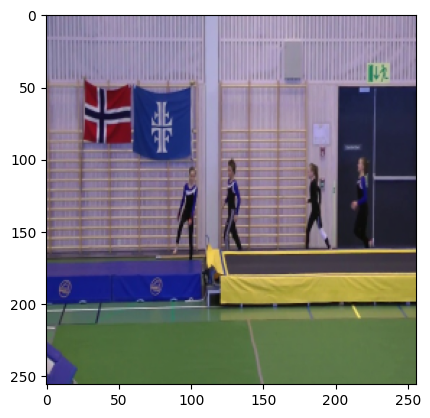

In [253]:
features = next(iter(demo_video_dataloader))
ani=animate_images(features[0][2:,:,:,:].detach().cpu())
HTML(ani.to_jshtml()) 

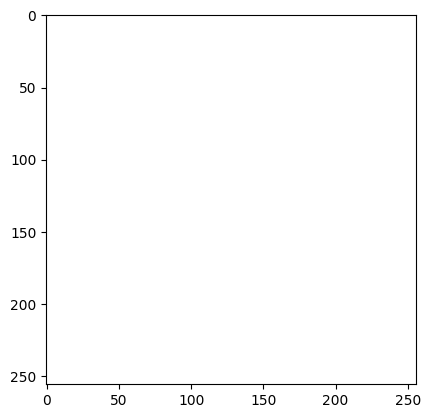

In [258]:
noise_generator = lambda y: NoiseModel().discrete_variance_noise_convolution(y,device,k_size=7,noise_steps=4,max_sigma=8).to(device) 
noisy_features=noise_generator(features)
ani=animate_images(noisy_features[0][2:,:,:,:].detach().cpu())
HTML(ani.to_jshtml()) 

MovieWriter ffmpeg unavailable; using Pillow instead.


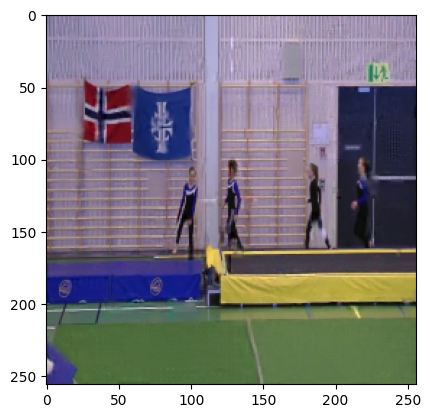

In [259]:

split = split_frames(noisy_features)
split = [model(piece.cuda()).detach().cpu() for piece in split]
joined = join_frames(split)
ani=animate_images(joined[0].clip(-1,1),save=True)
HTML(ani.to_jshtml()) 